In [2]:
import geopandas as gpd
import pandas as pd

from detect_wildlife_crossings.modelling.visualization import (
    plot_detection_subset,
    get_idx,
)

In [2]:
%matplotlib widget

In [3]:
inference_export = "../model/runs/cassda-wildlife-crossing/yolo11-CH-conf0_35/detection_results_filtered_road_intersect.csv"
image_dir = "E:/cassda-data/street-tiles/CH/images"

In [4]:
df_filtered = pd.read_csv(f"{inference_export}", header=0)
detections = df_filtered.to_dict(orient="records")

gdf_filtered = gpd.GeoDataFrame(
    df_filtered,
    geometry=gpd.points_from_xy(df_filtered.xc_epsg3035, df_filtered.yc_epsg3035),
    crs="EPSG:3035",
)

In [5]:
# create plot with 3 columns and 10 rows, repeat until all images are plotted
ncols = 3
nrows = 5
imgs_per_plot = ncols * nrows
num_plots = (len(detections) + imgs_per_plot - 1) // imgs_per_plot

Plotting images 0 to 15 out of 31


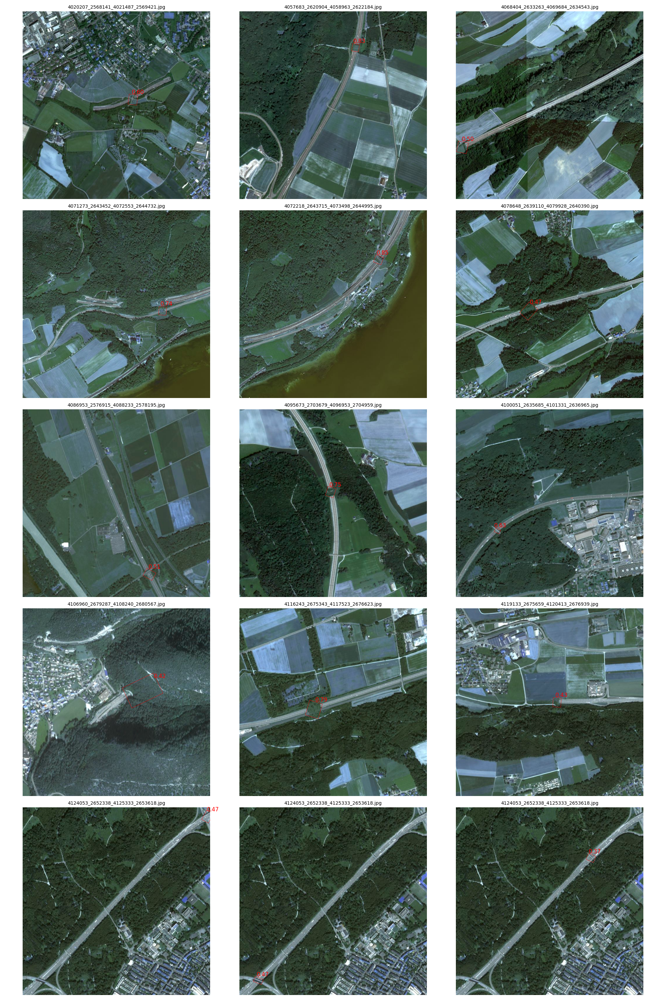

In [6]:
plot_id = 0  # Change this value to view different subsets
start_idx, end_idx = get_idx(plot_id, len(detections), imgs_per_plot)
detections_subset = detections[start_idx:end_idx]

print(f"Plotting images {start_idx} to {end_idx} out of {len(detections)}")
plot_detection_subset(detections_subset, nrows, ncols, image_dir)